In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, date 
import datetime
import seaborn as sns

In [97]:
Customer_Demographe = pd.read_csv("C:/Users/matages/Desktop/Customer Segmentation/row_data/Customer_Demographe.csv", encoding='windows-1252')

In [98]:
Customer_Demographe.head()

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,...,Unnamed: 246,Unnamed: 247,Unnamed: 248,Unnamed: 249,Unnamed: 250,Unnamed: 251,Unnamed: 252,Unnamed: 253,Unnamed: 254,Unnamed: 255
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Arlin,Dearle,Male,61,1954-01-20,Recruiting Manager,Property,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Talbot,NaN,Male,33,1961-10-03,NaN,IT,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,NaN,Affluent Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
Customer_Demographe = Customer_Demographe.iloc[:,0:13]

In [100]:
Customer_Demographe[Customer_Demographe.duplicated()]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure


In [101]:
Customer_Demographe.isnull().sum()

customer_id                              0
first_name                               0
last_name                              125
gender                                   0
past_3_years_bike_related_purchases      0
DOB                                     87
job_title                              506
job_industry_category                  656
wealth_segment                           0
deceased_indicator                       0
default                                302
owns_car                                 0
tenure                                  87
dtype: int64

In [102]:
Customer_Demographe["customer_id"].duplicated().sum()

0

In [103]:
Customer_Demographe["last_name"] = Customer_Demographe["last_name"].fillna(value="missing")
Customer_Demographe[Customer_Demographe["last_name"]=="missing"]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure
3,4,Talbot,missing,Male,33,1961-10-03,NaN,IT,Mass Customer,N,() { _; } >_[$($())] { touch /tmp/blns.shellsh...,No,7.0
66,67,Vernon,missing,Male,67,1960-06-14,Web Developer II,Retail,Mass Customer,N,<svg><script>0<1>alert('XSS')</script>,No,18.0
105,106,Glyn,missing,Male,54,1966-07-03,Software Test Engineer III,Health,High Net Worth,N,?????????????????,Yes,18.0
138,139,Gar,missing,Male,1,1964-07-28,Operator,Telecommunications,Affluent Customer,N,-1.00E+02,No,4.0
196,197,Avis,missing,Female,32,1977-01-27,NaN,NaN,High Net Worth,N,NaN,No,5.0
210,211,Beitris,missing,Female,6,1974-03-04,VP Marketing,Manufacturing,Mass Customer,N,-0.5,Yes,5.0
249,250,Kristofer,missing,Male,53,1988-04-15,Legal Assistant,Health,Mass Customer,N,??????,Yes,13.0
250,251,Mala,missing,Female,88,1977-12-24,VP Sales,Financial Services,Affluent Customer,N,????????????????,Yes,10.0
256,257,Marissa,missing,Female,70,1966-02-08,Sales Associate,Manufacturing,Affluent Customer,N,???????????????? ????????????????,Yes,19.0
274,275,Dud,missing,Male,7,1955-07-27,VP Sales,Health,High Net Worth,N,?? ? ? ? ? ? ? ??,No,13.0


In [104]:
Customer_Demographe["fullname"] = Customer_Demographe["first_name"] +" " + Customer_Demographe["last_name"]
len(set(Customer_Demographe["fullname"])) != len(Customer_Demographe["fullname"])

True

In [105]:
Customer_Demographe["fullname"][Customer_Demographe["last_name"].isnull()]

Series([], Name: fullname, dtype: object)

In [106]:
Customer_Demographe["gender"].value_counts()

gender
Female    2037
Male      1872
U           88
F            1
Femal        1
M            1
Name: count, dtype: int64

In [107]:
Customer_Demographe['gender'] = Customer_Demographe['gender'].replace(['F','Femal'], 'Female')
Customer_Demographe['gender'] = Customer_Demographe['gender'].replace(['M'], 'Male')
Customer_Demographe["gender"].value_counts()

gender
Female    2039
Male      1873
U           88
Name: count, dtype: int64

In [108]:
indexGender = Customer_Demographe[Customer_Demographe["gender"] == "U"].index
Customer_Demographe.drop(indexGender , inplace=True)

In [109]:
Customer_Demographe["gender"].value_counts()

gender
Female    2039
Male      1873
Name: count, dtype: int64

<Axes: ylabel='past_3_years_bike_related_purchases'>

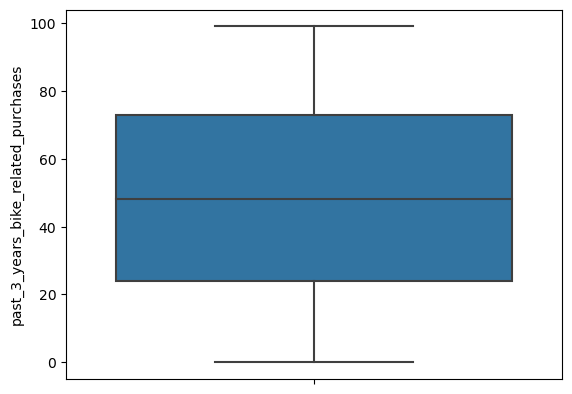

In [110]:
sns.boxplot(y = Customer_Demographe["past_3_years_bike_related_purchases"],data = Customer_Demographe)

In [111]:
Customer_Demographe["DOB"] = pd.to_datetime(Customer_Demographe["DOB"],format = '%Y-%m-%d')

<Axes: xlabel='DOB', ylabel='DOB'>

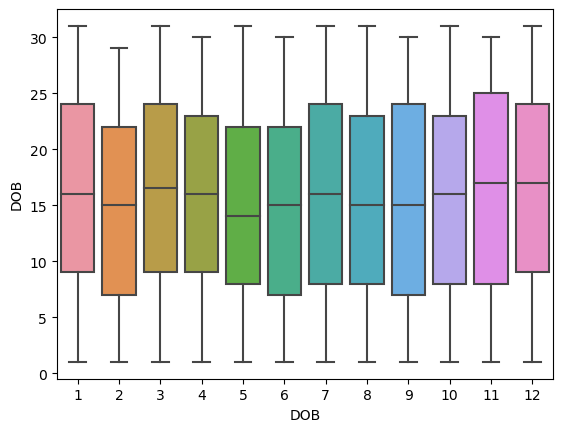

In [112]:
sns.boxplot(x = Customer_Demographe["DOB"].dt.month,y = Customer_Demographe["DOB"].dt.day,data = Customer_Demographe)

In [113]:
pd.set_option("display.max_rows", None)
Customer_Demographe['job_title'].value_counts()

job_title
Business Systems Development Analyst    43
Tax Accountant                          43
Social Worker                           42
Recruiting Manager                      41
Internal Auditor                        40
General Manager                         39
Associate Professor                     39
Structural Engineer                     38
Sales Representative                    38
Desktop Support Technician              38
Legal Assistant                         38
Junior Executive                        38
Dental Hygienist                        37
Chemical Engineer                       37
Technical Writer                        36
Cost Accountant                         36
Product Engineer                        36
Senior Financial Analyst                35
Executive Secretary                     35
Registered Nurse                        34
VP Product Management                   34
Senior Developer                        34
Food Chemist                            34
A

In [114]:
Customer_Demographe[Customer_Demographe['job_title'].isnull()]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure,fullname
3,4,Talbot,missing,Male,33,1961-10-03,NaN,IT,Mass Customer,N,() { _; } >_[$($())] { touch /tmp/blns.shellsh...,No,7.0,Talbot missing
5,6,Curr,Duckhouse,Male,35,1966-09-16,NaN,Retail,High Net Worth,N,?? ? ? ?,Yes,13.0,Curr Duckhouse
6,7,Fina,Merali,Female,6,1976-02-23,NaN,Financial Services,Affluent Customer,N,?????????,Yes,11.0,Fina Merali
10,11,Uriah,Bisatt,Male,99,1954-04-30,NaN,Property,Mass Customer,N,??????? ??????????,No,9.0,Uriah Bisatt
21,22,Deeanne,Durtnell,Female,79,1962-12-10,NaN,IT,Mass Customer,N,??????,No,11.0,Deeanne Durtnell
22,23,Olav,Polak,Male,43,1995-02-10,NaN,NaN,High Net Worth,N,01-Feb,Yes,1.0,Olav Polak
29,30,Darrick,Helleckas,Male,18,1961-10-18,NaN,IT,Affluent Customer,N,???????? ?????????,Yes,6.0,Darrick Helleckas
45,46,Kaila,Allin,Female,98,1972-02-26,NaN,NaN,Affluent Customer,N,?????????,Yes,15.0,Kaila Allin
51,52,Curran,Bentson,Male,57,1988-06-22,NaN,Financial Services,Mass Customer,N,01-Feb,Yes,13.0,Curran Bentson
59,60,Nadiya,Champerlen,Female,18,1970-02-04,NaN,Manufacturing,Mass Customer,N,?,No,10.0,Nadiya Champerlen


In [115]:
pd.set_option("display.max_rows", None)
Customer_Demographe['job_industry_category'].value_counts()

job_industry_category
Manufacturing         796
Financial Services    767
Health                596
Retail                358
Property              267
IT                    151
Entertainment         136
Argiculture           113
Telecommunications     72
Name: count, dtype: int64

In [116]:
Customer_Demographe[Customer_Demographe['job_industry_category'].isnull()]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure,fullname
4,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,NaN,Affluent Customer,N,NIL,Yes,8.0,Sheila-kathryn Calton
7,8,Rod,Inder,Male,31,1962-03-30,Media Manager I,NaN,Mass Customer,N,(??????????????? ?????),No,7.0,Rod Inder
15,16,Harlin,Parr,Male,38,1977-02-27,Media Manager IV,NaN,Mass Customer,N,1.00E+96,Yes,18.0,Harlin Parr
16,17,Heath,Faraday,Male,57,1962-03-19,Sales Associate,NaN,Affluent Customer,N,???????????(??????????)?????????,Yes,15.0,Heath Faraday
17,18,Marjie,Neasham,Female,79,1967-07-06,Professor,NaN,Affluent Customer,N,?????????????????,No,11.0,Marjie Neasham
22,23,Olav,Polak,Male,43,1995-02-10,NaN,NaN,High Net Worth,N,01-Feb,Yes,1.0,Olav Polak
32,33,Ernst,Hacon,Male,44,1957-06-25,Product Engineer,NaN,Affluent Customer,N,<script>alert('hi')</script>,Yes,11.0,Ernst Hacon
35,36,Lurette,Stonnell,Female,33,1977-11-09,VP Quality Control,NaN,Affluent Customer,N,"<>?:""{}|_+",No,22.0,Lurette Stonnell
45,46,Kaila,Allin,Female,98,1972-02-26,NaN,NaN,Affluent Customer,N,?????????,Yes,15.0,Kaila Allin
47,48,Rebbecca,Casone,Female,46,1975-08-15,Biostatistician II,NaN,Mass Customer,N,../../../../../../../../../../../etc/hosts,Yes,8.0,Rebbecca Casone


In [117]:
Customer_Demographe["wealth_segment"].value_counts()

wealth_segment
Mass Customer        1954
High Net Worth        996
Affluent Customer     962
Name: count, dtype: int64

In [118]:
Customer_Demographe["deceased_indicator"].value_counts()

deceased_indicator
N    3910
Y       2
Name: count, dtype: int64

In [119]:
Customer_Demographe["default"].value_counts()

default
?                                                                                                                                                                                                                     153
??????                                                                                                                                                                                                                138
??test??                                                                                                                                                                                                              126
?????????????????                                                                                                                                                                                                     112
1.00E+02                                                                                                                

In [120]:
Customer_Demographe["owns_car"].value_counts()

owns_car
Yes    1974
No     1938
Name: count, dtype: int64

<Axes: ylabel='tenure'>

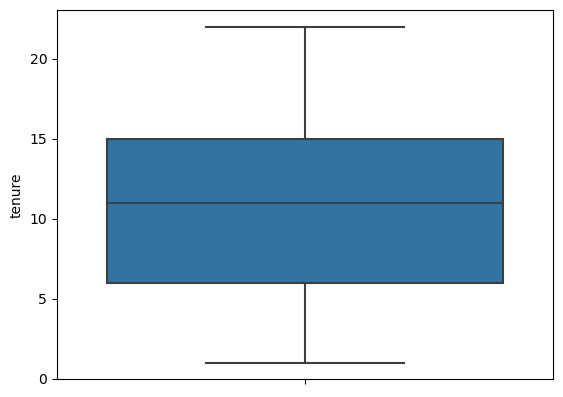

In [121]:
sns.boxplot(y = Customer_Demographe["tenure"],data = Customer_Demographe)

In [122]:
Customer_Demographe["AGE"] =  2017-Customer_Demographe["DOB"].dt.year

<Axes: ylabel='AGE'>

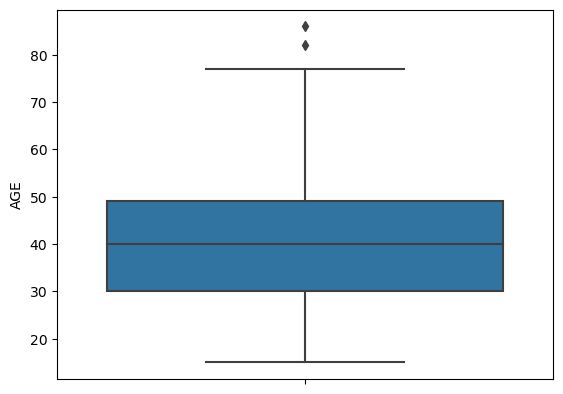

In [123]:
sns.boxplot(y = Customer_Demographe["AGE"],data = Customer_Demographe)

In [124]:
indexAge = Customer_Demographe[Customer_Demographe["AGE"] > 100].index
Customer_Demographe.drop(indexAge , inplace=True)

<Axes: ylabel='AGE'>

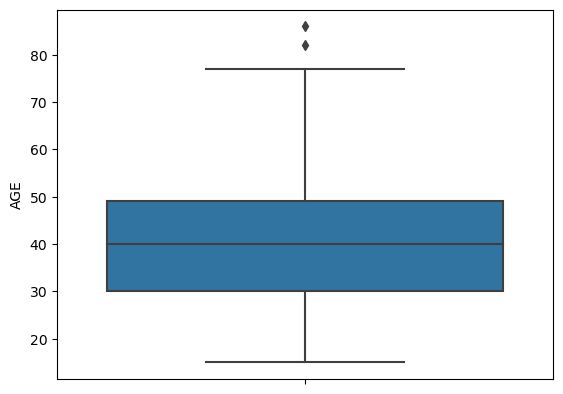

In [125]:
sns.boxplot(y = Customer_Demographe["AGE"],data = Customer_Demographe)

In [126]:
Customer_Demographe

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure,fullname,AGE
0,1,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0,Laraine Medendorp,64
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,<script>alert('hi')</script>,Yes,16.0,Eli Bockman,37
2,3,Arlin,Dearle,Male,61,1954-01-20,Recruiting Manager,Property,Mass Customer,N,01-Feb,Yes,15.0,Arlin Dearle,63
3,4,Talbot,missing,Male,33,1961-10-03,NaN,IT,Mass Customer,N,() { _; } >_[$($())] { touch /tmp/blns.shellsh...,No,7.0,Talbot missing,56
4,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,NaN,Affluent Customer,N,NIL,Yes,8.0,Sheila-kathryn Calton,40
5,6,Curr,Duckhouse,Male,35,1966-09-16,NaN,Retail,High Net Worth,N,?? ? ? ?,Yes,13.0,Curr Duckhouse,51
6,7,Fina,Merali,Female,6,1976-02-23,NaN,Financial Services,Affluent Customer,N,?????????,Yes,11.0,Fina Merali,41
7,8,Rod,Inder,Male,31,1962-03-30,Media Manager I,NaN,Mass Customer,N,(??????????????? ?????),No,7.0,Rod Inder,55
8,9,Mala,Lind,Female,97,1973-03-10,Business Systems Development Analyst,Argiculture,Affluent Customer,N,0/0,Yes,8.0,Mala Lind,44
9,10,Fiorenze,Birdall,Female,49,1988-10-11,Senior Quality Engineer,Financial Services,Mass Customer,N,????,Yes,20.0,Fiorenze Birdall,29


In [127]:
Customer_Demographe["deceased_indicator"].value_counts()

deceased_indicator
N    3910
Y       2
Name: count, dtype: int64

In [128]:
Customer_Demographe.isnull().sum()

customer_id                              0
first_name                               0
last_name                                0
gender                                   0
past_3_years_bike_related_purchases      0
DOB                                      0
job_title                              497
job_industry_category                  656
wealth_segment                           0
deceased_indicator                       0
default                                214
owns_car                                 0
tenure                                   0
fullname                                 0
AGE                                      0
dtype: int64

In [129]:
Customer_Demographe = Customer_Demographe.drop(['default'],axis=1)

In [130]:
Customer_Demographe.isnull().sum()

customer_id                              0
first_name                               0
last_name                                0
gender                                   0
past_3_years_bike_related_purchases      0
DOB                                      0
job_title                              497
job_industry_category                  656
wealth_segment                           0
deceased_indicator                       0
owns_car                                 0
tenure                                   0
fullname                                 0
AGE                                      0
dtype: int64

In [131]:
Customer_Demographe.to_csv("C:/Users/matages/Desktop/Customer Segmentation/Clean_data/Customer_Demographe_Clean.csv")

## JOIN CUSTOMER

In [132]:
New_Customer_clean = pd.read_csv("C:/Users/matages/Desktop/Customer Segmentation/Clean_data/New_Customer_Clean.csv")

In [133]:
New_Customer_clean['fullname'].head()

0      Chickie Brister
1         Morly Genery
2    Ardelis Forrester
3         Lucine Stutt
4       Melinda Hadlee
Name: fullname, dtype: object

In [134]:
Customer_Demographe['fullname'].head()

0        Laraine Medendorp
1              Eli Bockman
2             Arlin Dearle
3           Talbot missing
4    Sheila-kathryn Calton
Name: fullname, dtype: object

In [135]:
Customer_N_C = pd.concat([Customer_Demographe, New_Customer_clean],ignore_index=True)

In [136]:
Customer_N_C

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,...,state,country,property_valuation,missing_colname 16,missing_colname 17,missing_colname 18,missing_colname 19,missing_colname 20,Rank,Value
0,1.0,Laraine,Medendorp,Female,93,1953-10-12 00:00:00,Executive Secretary,Health,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,Eli,Bockman,Male,81,1980-12-16 00:00:00,Administrative Officer,Financial Services,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,Arlin,Dearle,Male,61,1954-01-20 00:00:00,Recruiting Manager,Property,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,Talbot,missing,Male,33,1961-10-03 00:00:00,NaN,IT,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,Sheila-kathryn,Calton,Female,56,1977-05-13 00:00:00,Senior Editor,NaN,Affluent Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6.0,Curr,Duckhouse,Male,35,1966-09-16 00:00:00,NaN,Retail,High Net Worth,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7.0,Fina,Merali,Female,6,1976-02-23 00:00:00,NaN,Financial Services,Affluent Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8.0,Rod,Inder,Male,31,1962-03-30 00:00:00,Media Manager I,NaN,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9.0,Mala,Lind,Female,97,1973-03-10 00:00:00,Business Systems Development Analyst,Argiculture,Affluent Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10.0,Fiorenze,Birdall,Female,49,1988-10-11 00:00:00,Senior Quality Engineer,Financial Services,Mass Customer,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [137]:
Customer_N_C['fullname'][Customer_N_C['fullname'].duplicated(keep = False)]

104          Glyn missing
917     Corabelle missing
1864    Corabelle missing
4113         Glyn missing
Name: fullname, dtype: object